In [ ]:
!pip install torcheval
!pip install yadisk
!rm -rf sample_data

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.4/158.4 KB 944.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.6/83.6 KB 5.2 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.9/54.9 KB 7.0 MB/s eta 0:00:00


In [ ]:
import yadisk
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from PIL import Image
import os
from tqdm import tqdm
from collections import defaultdict

import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision import transforms
from torcheval.metrics.functional import multiclass_f1_score

import tensorflow as tf
from tensorflow import summary

import datetime

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device: {device}')

Device: cuda


In [ ]:
%%time

token_key = ""
dataset_ya_path = "cv_kaggle/vk-made-sports-image-classification.zip"
dataset_local_path = "data.zip"

y = yadisk.YaDisk(token=token_key)
y.download(dataset_ya_path, dataset_local_path)

In [ ]:
!unzip data.zip
!rm data.zip

In [ ]:
train_csv_path = 'train.csv'
test_csv_path = 'test.csv'
train_img_dir = 'train/'
test_img_dir = 'test/'

In [ ]:
train_df = pd.read_csv(train_csv_path)
test_df = pd.read_csv(test_csv_path)

In [ ]:
name_to_label = dict(zip(train_df.label.unique(), np.arange(train_df.label.nunique())))

### EDA

In [ ]:
num_classes = train_df.label.nunique()

In [ ]:
print(f"Train image dataset size: {train_df.shape[0]}")
print(f"Test image dataset size: {test_df.shape[0]}")
print(f"Number of target classes: {num_classes}")

Train image dataset size: 45373
Test image dataset size: 19446
Number of target classes: 30


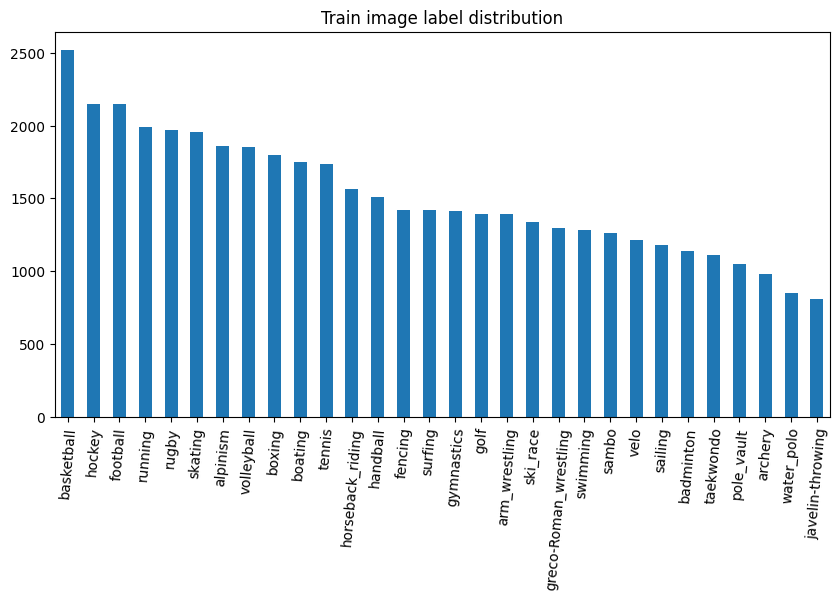

In [ ]:
# train label distribution
ax = train_df.label.value_counts().plot.bar(rot=85, figsize=(10, 5))
ax.set_title('Train image label distribution')
plt.show()

In [ ]:
# get unique sizes of images:
train_img_sizes = defaultdict(int)
test_img_sizes = defaultdict(int)

for img_name in tqdm(os.listdir(train_img_dir)):
    img_path = os.path.join(train_img_dir, img_name)
    img = Image.open(img_path)
    img_size = np.array(img).shape
    train_img_sizes[img_size] += 1

for img_name in tqdm(os.listdir(test_img_dir)):
    img_path = os.path.join(test_img_dir, img_name)
    img = Image.open(img_path)
    img_size = np.array(img).shape
    test_img_sizes[img_size] += 1

100%|██████████| 19446/19446 [01:46<00:00, 181.78it/s]


In [ ]:
sorted(list(zip(img_sizes.values(), img_sizes.keys())), reverse=True)

__Note:__ В датасете имеются изображения и портретной и альбомной ориентации. Мне кажется для первоначального приближения их можно скастить к виду 450 x 300

In [ ]:
def plot_samples(dataset_path: str,
                 df_csv: pd.DataFrame,
                 label: str = 'all',
                 n_rows: int = 2,
                 n_cols: int = 2,
                 figure_size: tuple = (10, 10)):
  
    fig, ax = plt.subplots(n_rows, n_cols, figsize=figure_size)
    n_imgs = n_rows * n_cols

    has_labels = 'label' in df_csv.columns

    if label != 'all':
        if has_labels: 
            df_csv = df_csv[df_csv.label == label]
        else:
            raise RuntimeError("Test dataset does not have labels! Do not use 'label' argument")

    sample_names = df_csv.sample(n_imgs)

    img_names = sample_names.image_id
    img_labels = sample_names.label if has_labels else None
    

    for i in range(n_rows):
        for j in range(n_cols):
            img_index = i * n_cols + j
            img_path = os.path.join(dataset_path, img_names.iloc[img_index])
            
            img = Image.open(img_path)
            img_label = img_labels.iloc[img_index] if (img_labels is not None) else ''

            axes = ax[i][j] if n_rows > 1 else ax[j]
            axes.imshow(img)
            axes.set_title(img_label)
            axes.axis("off")

In [ ]:
plot_samples(train_img_dir, train_df, 'all', 2, 5, figure_size=(10, 5))

In [ ]:
plot_samples(test_img_dir, test_df, 'all', 2, 5, figure_size=(10, 5))

<ipython-input-104-00e9026e6761>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(n_rows, n_cols, figsize=figure_size)


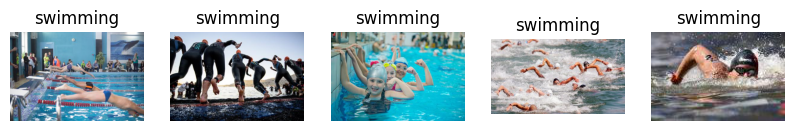

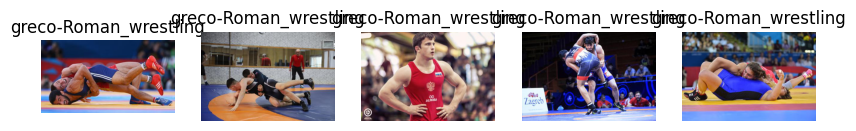

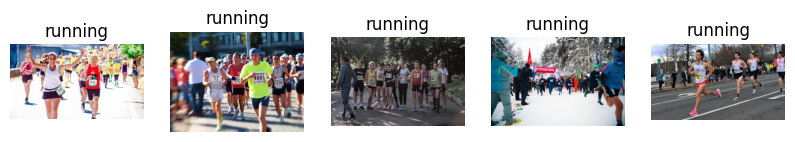

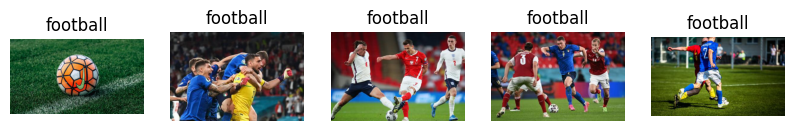

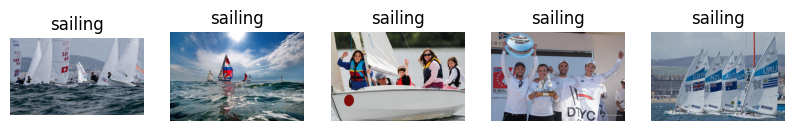

...

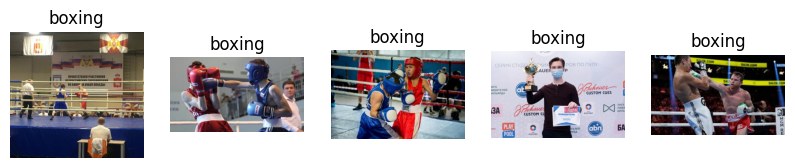

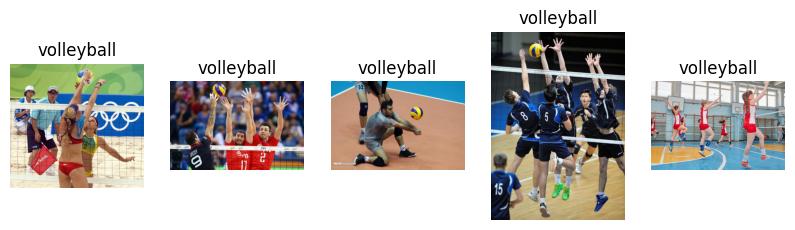

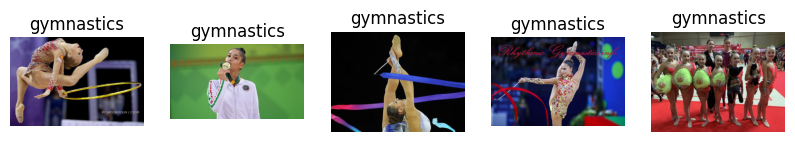

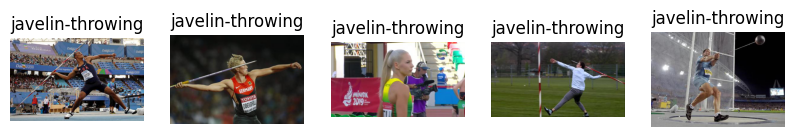

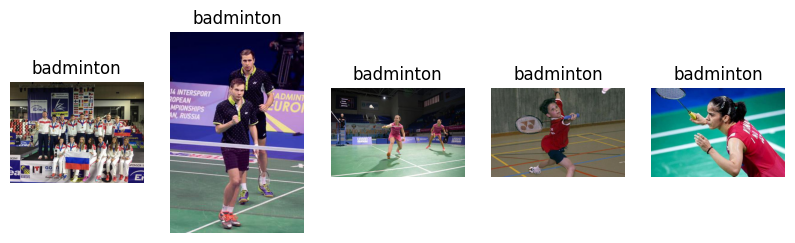

In [ ]:
for label in name_to_label.keys():
    plot_samples(train_img_dir, train_df, label, 1, 5, figure_size=(10, 5))

__Note:__ Можно заметить, что в датасете присутсвуют картинки, которые нек содержат специфичных особеностей. То есть если мы не знаем контекста, то человеку будет непонятно в какую категорию отнести объект. Например: фото спортсмена без атрибутики или спорстмена с медалью. Кажется, что такие объекты могут вредить обучению и хорошо бы их удалить из корпуса (вручную)

### Split data into train/val/test

In [ ]:
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(train_df,
                                    random_state=153,
                                    test_size=0.1,
                                    stratify=train_df.label)

In [ ]:
print(f"Train image dataset size: {train_df.shape[0]}")
print(f"Validation image dataset size: {val_df.shape[0]}")
print(f"Test image dataset size: {test_df.shape[0]}")

Train image dataset size: 40835
Validation image dataset size: 4538
Test image dataset size: 19446


In [ ]:
csv_path = 'csv/'
os.makedirs(csv_path, exist_ok=True)
train_df.to_csv(os.path.join(csv_path, 'train.csv'), header=True, index=False)
val_df.to_csv(os.path.join(csv_path, 'val.csv'), header=True, index=False)
test_df.to_csv(os.path.join(csv_path, 'test.csv'), header=True, index=False)

### Dataset & Dataloaders

In [ ]:
transforms_storage = dict()

transforms_storage['default'] = transforms.Compose([
                                        transforms.ToTensor(),
                                        transforms.Resize((300, 450), antialias=True),
                                        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
                                        transforms.RandomHorizontalFlip(p=0.5),
                                    ])

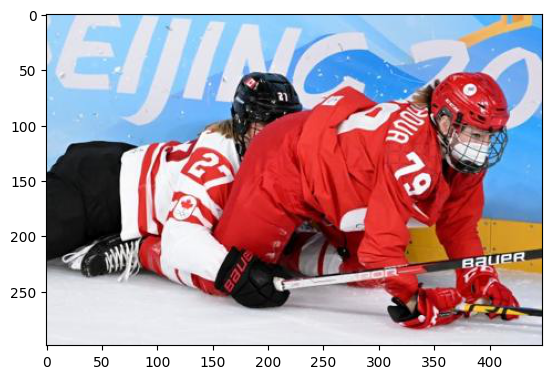

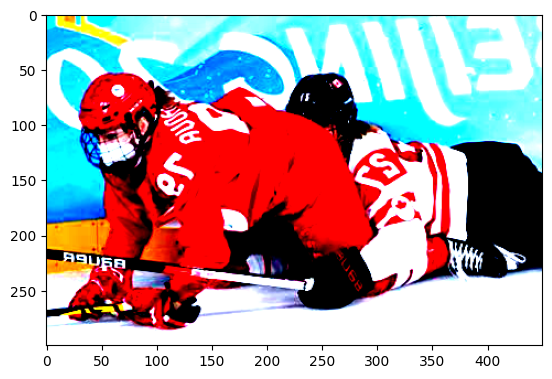

In [ ]:
img = Image.open(
    os.path.join(train_img_dir, np.random.choice(os.listdir(train_img_dir), 1)[0])
).convert('RGB')

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((300, 450)),
    transforms.RandomRotation(degrees=20),
    transforms.RandomCrop((250, 166)),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    transforms.RandomHorizontalFlip(p=0.5),
    ])

plt.imshow(img)
plt.show()
plt.imshow(transforms_storage['default'](img).permute(1, 2, 0))

In [ ]:
def target_transform(label_str):
    return name_to_label[label_str]

In [ ]:
class SportDataset(Dataset):
    def __init__(self, annotations_file, img_dir, transform=None, target_transform=None):
        self.img_info = pd.read_csv(annotations_file)
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform

        self.has_labels = 'label' in self.img_info.columns

    def __len__(self):
        return len(self.img_info)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_info.image_id.iloc[idx])
        image = Image.open(img_path).convert('RGB')
        
        label = self.img_info.label.iloc[idx] if self.has_labels else None
        
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)

        return image, label

In [ ]:
transformer_main = transforms_storage['default']
transformer_target_main = target_transform

train_dataset = SportDataset(os.path.join('csv', 'train.csv'),
                             train_img_dir,
                             transform=transformer_main,
                             target_transform=transformer_target_main)

val_dataset = SportDataset(os.path.join('csv', 'val.csv'),
                           train_img_dir,
                           transform=transformer_main,
                           target_transform=transformer_target_main)

test_dataset = SportDataset(os.path.join('csv', 'test.csv'),
                            test_img_dir,
                            transform=transformer_main,
                            target_transform=transformer_target_main)

In [ ]:
batch_size = 32
num_workers = 2

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True)

### Model preparing

In [ ]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnext50_32x4d', pretrained=True)
model.fc = torch.nn.Linear(in_features=model.fc.in_features, out_features=num_classes, bias=True)
model.to(device)
model.train()

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth
100%|██████████| 95.8M/95.8M [00:01<00:00, 97.4MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1

In [ ]:
optimizer_params = {
    'params' : model.parameters(),
    'lr' : 3e-4,
}

optimizer = torch.optim.Adam(**optimizer_params)

lr_scheduler_params = {
    'optimizer' : optimizer,
    'gamma' : 0.9 
}

scheduler = torch.optim.lr_scheduler.ExponentialLR(**lr_scheduler_params)

criterion = torch.nn.CrossEntropyLoss()

In [ ]:
current_time = str(datetime.datetime.now().timestamp())
train_log_dir = 'logs/tensorboard/train/' + current_time
val_log_dir = 'logs/tensorboard/val/' + current_time
test_log_dir = 'logs/tensorboard/test/' + current_time

train_summary_writer = summary.create_file_writer(train_log_dir)
val_summary_writer = summary.create_file_writer(val_log_dir)
test_summary_writer = summary.create_file_writer(test_log_dir)

In [ ]:
n_epochs = 20

for n_ep in range(n_epochs):
    
    # training 
    model.train()
    train_loss = 0
    for (batch_images, batch_labels) in tqdm(train_dataloader):

        batch_images = batch_images.to(device)
        batch_labels = batch_labels.to(device)

        optimizer.zero_grad()

        output = model(batch_images)
        loss = criterion(output, batch_labels)
        
        train_loss += loss.item()
        loss.backward()
        optimizer.step()
    
    scheduler.step()
    
    with train_summary_writer.as_default():
        tf.summary.scalar('loss', train_loss, step=n_ep)

    # validation 
    model.eval()
    with torch.no_grad():
        val_metrics = []
        val_loss = 0
        for (batch_images, batch_labels) in tqdm(val_dataloader):
            batch_images = batch_images.to(device)
            batch_labels = batch_labels.to(device)

            output = model(batch_images)
            output_labels = output.argmax(dim=1)

            loss = criterion(output, batch_labels)
            val_loss += loss.item()

            f1_micro_score = multiclass_f1_score(input=output_labels,
                                                 target=batch_labels,
                                                 num_classes=num_classes,
                                                 average='micro')
            
            val_metrics.append(f1_micro_score.item())

        val_metric = np.mean(val_metrics)

        with val_summary_writer.as_default():
            tf.summary.scalar('f1_micro', val_metric, step=n_ep)

        with val_summary_writer.as_default():
            tf.summary.scalar('loss', val_loss, step=n_ep)

        print(f"Epoch #{n_ep}: validation f1_micro = {val_metric}")


100%|██████████| 142/142 [00:54<00:00,  2.61it/s]


Epoch #0: validation f1_micro = 0.8417862947558014


100%|██████████| 142/142 [00:54<00:00,  2.59it/s]


Epoch #1: validation f1_micro = 0.8670436076714959


100%|██████████| 142/142 [00:54<00:00,  2.62it/s]


Epoch #2: validation f1_micro = 0.8900832882229711


100%|██████████| 142/142 [00:54<00:00,  2.63it/s]


Epoch #3: validation f1_micro = 0.893502844051576


100%|██████████| 142/142 [00:54<00:00,  2.63it/s]


Epoch #4: validation f1_micro = 0.8977349673358488


100%|██████████| 142/142 [00:54<00:00,  2.60it/s]


Epoch #5: validation f1_micro = 0.9034567983217643


100%|██████████| 142/142 [00:54<00:00,  2.63it/s]


Epoch #6: validation f1_micro = 0.8966346152231727


 61%|██████    | 775/1277 [17:26<11:19,  1.35s/it]

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs/tensorboard

<IPython.core.display.Javascript object>

In [ ]:
# закинуть все на гпу-девайс
# почистить данные ручками
# добавить больше аугиментаций
# поэксперементировать с бекбонами и тд
# использовать learning rate scheme 